<a href="https://colab.research.google.com/github/allisonlehn9/notebook/blob/master/Final%20Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Overview
European cities all have their individual flair, but can seem incredibly similar, especially after you've seen too many. I have collected many travel images from various European cities, and I am curious if, given this data, I could generate European-looking city images using machine learning. Due to time and space constraints, I will only be looking at images from Spain and England.

I will first attempt a more simple Principal Components Analysis, reducing the images to a certain number of dimensions, and then using the model to generate images by inputting different values for each of the dimensions.

I will then use the much more complicated Generational Adversarial Neural Network. This works by a Convolutional Neural Network generating random noise and running it through a discriminator network trained on actual data, which will classify the noise as fake, until the generated output looks real enough to trick this discriminator.

I will examine the invididual outputs of the English data and Spanish data, then combine the two. 

# Initial imports

In [2]:
pip install python-resize-image

In [104]:
import matplotlib.pyplot as plt
import numpy as np
import random

# neural network libraries
import tensorflow as tf
from tensorflow.keras.layers import (Dense, 
                                     BatchNormalization, 
                                     LeakyReLU, 
                                     Reshape, 
                                     Conv2DTranspose,
                                     Conv2D,
                                     Dropout,
                                     Flatten)


# import city images
from google.colab import drive
from glob import glob
# process images
from PIL import Image
from resizeimage import resizeimage
# PCA
from sklearn.decomposition import PCA
# SVC
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix

In [4]:
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Colab Notebooks/

Mounted at /content/drive
/content/drive/MyDrive/Colab Notebooks


Since the photos were taken on an iPhone, they were stored in .HEIC format. This did not preserve orientation through import, so I manually separated portrait and landscape photos, and rotated the portrait ones that read into arrays strangely.

In [5]:
england_portrait = glob('england/*')
spain_portrait = glob('spain/*')
england_landscape = glob('england landscape/*')
spain_landscape = glob('spain landscape/*')

In [6]:
IM_SIZE = 80

In [7]:
def flatten(img_file, portrait=True):
    flat = []
    for img in img_file:
        # read file in binary mode
        with open(img, 'r+b') as f:
            with Image.open(f) as i:
                resized = resizeimage.resize_cover(i, [IM_SIZE,IM_SIZE])
                arr = np.array(resized)
                if portrait:
                  arr = np.rot90(arr,3) # rotate the portrait images
                flat.append(arr)
    return np.asarray(flat)

In [41]:
# england
ep_data = flatten(england_portrait)
el_data = flatten(england_landscape, portrait=False)

In [42]:
e_data = np.concatenate((ep_data, el_data))

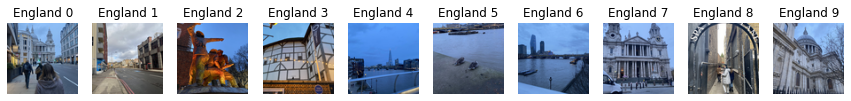

In [12]:
fig, ax = plt.subplots(1,10, figsize=(15,5))

for i in range(10):
    e_img = Image.fromarray(e_data[i].reshape(IM_SIZE,IM_SIZE,3), 'RGB')
    
    ax[i].imshow(e_img)
    ax[i].axis('off')
    ax[i].set_title(f'England {i}')
plt.show()

In [8]:
# spain
sp_data = flatten(spain_portrait)
sl_data = flatten(spain_landscape, portrait=False)

In [10]:
s_data = np.concatenate((sp_data, sl_data))

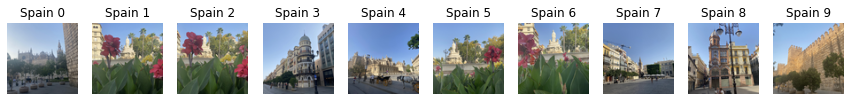

In [11]:
fig, ax = plt.subplots(1,10, figsize=(15,5))

for i in range(10):
    s_img = Image.fromarray(s_data[i].reshape(IM_SIZE,IM_SIZE,3), 'RGB')
    
    ax[i].imshow(s_img)
    ax[i].axis('off')
    ax[i].set_title(f'Spain {i}')
plt.show()

In [43]:
all_data = np.concatenate((e_data, s_data))

# PCA
I start with creating a low dimensional representation of the images to see what kind of images it generates this way. I want to reduce the number of dimensions to see if it starts to create a sort of common image based on the training data.

### England

In [82]:
# convert data to correct shape for PCA
flattened_eng = e_data.reshape(len(e_data),IM_SIZE*IM_SIZE*3)
flattened_eng.shape

(444, 19200)

In [83]:
COMPS = 80
pca_eng = PCA(COMPS)

# project images onto 80 components
proj_imgs_eng = pca_eng.fit_transform(flattened_eng)
proj_imgs_eng

array([[ -274.99351205, -1624.36091436,  1662.09838501, ...,
          136.05782567,     8.635143  ,   -68.47830029],
       [-2390.5820306 ,  1554.08370222,    49.47956449, ...,
          -73.18264782,   294.41861454,   320.53210464],
       [ 2567.52307698, -4190.30400893,  3348.66612546, ...,
          515.18398005,   128.91389277,  -200.73514949],
       ...,
       [   16.49265011,  3431.049719  ,  3365.29261927, ...,
         -207.19192443,  -226.21254132,  -362.09660915],
       [ 1276.90600518,  3400.09110605,  2876.77092227, ...,
         -111.24187634,    41.90137937,   272.16923773],
       [  455.76446361,  3769.59651155,  1723.70614699, ...,
         -235.29941195,  -258.9215009 ,  -222.81448358]])

In [84]:
np.cumsum(pca_eng.explained_variance_ratio_)*100

array([19.8832106 , 28.02359587, 32.76166778, 37.0756757 , 40.50448293,
       43.47264917, 45.88951297, 47.69821693, 49.24052285, 50.69634405,
       52.00237989, 53.23143921, 54.32684936, 55.38804805, 56.32450488,
       57.25828769, 58.06784435, 58.8422199 , 59.53702711, 60.20563852,
       60.86826238, 61.48666298, 62.08979913, 62.65198144, 63.19904604,
       63.73466169, 64.24317102, 64.72515065, 65.19517874, 65.64455798,
       66.08353671, 66.50940894, 66.9202574 , 67.31894697, 67.70875693,
       68.08205567, 68.45270949, 68.81254791, 69.16377488, 69.49817597,
       69.82965191, 70.15728667, 70.47702543, 70.78986835, 71.0941282 ,
       71.39124691, 71.68017625, 71.96434962, 72.24266038, 72.51595545,
       72.78276795, 73.04678875, 73.30629398, 73.5596054 , 73.80978415,
       74.05387253, 74.29321084, 74.52987919, 74.76058255, 74.98770727,
       75.20534729, 75.42189527, 75.63615489, 75.84925482, 76.05644342,
       76.25785624, 76.45746411, 76.65468461, 76.84782964, 77.03

With 80 components, we explain 78% of the variance between the photos. I chose 80 components after several trials since this seemed to get enough accuracy to reconstruct the training photos reasonably well, while also creating a somewhat legible output photo.

In [85]:
# reset transformed projection to image format to display
inv_trans_eng = pca_eng.inverse_transform(proj_imgs_eng)

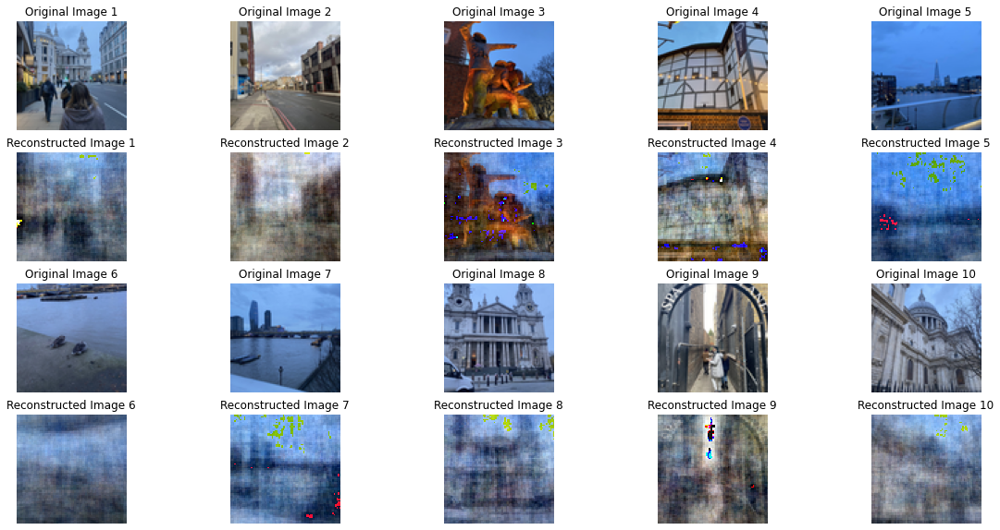

In [86]:
nrows, ncols = 4,5
fig, ax = plt.subplots(nrows,ncols, figsize=(20,10))

for i in range(10):
    r = (i // ncols)*2
    c = i % ncols
    # original image
    ax[r,c].imshow(e_data[i])
    ax[r,c].axis('off')
    ax[r,c].set_title(f'Original Image {i+1}')
    
    # reconstructed images after 2d PCA projection
    reshape = np.reshape(inv_trans_eng[i,:],(IM_SIZE,IM_SIZE,3))
    img = Image.fromarray(reshape.astype(np.uint8),mode='RGB')
    ax[r+1,c].imshow(img,interpolation='nearest')
    ax[r+1,c].axis('off')
    ax[r+1,c].set_title(f'Reconstructed Image {i+1}')

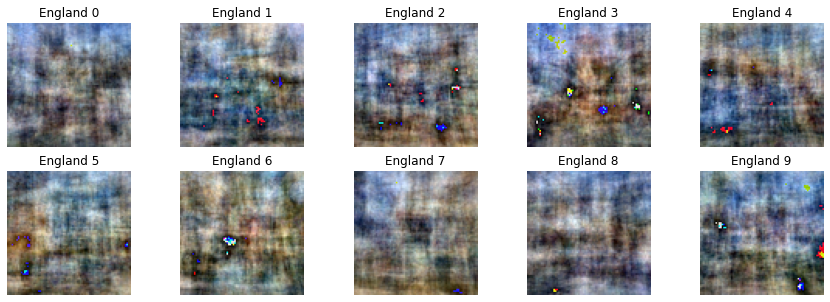

In [171]:
# generate new photos of england
fig, ax = plt.subplots(2,5, figsize=(15,5))
r = 0
c = 0
for i in range(10):
  new_point = pca_eng.inverse_transform(random.sample(range(-1000,1000), COMPS))
  new_img = Image.fromarray((new_point.astype(np.uint8)).reshape(IM_SIZE,IM_SIZE,3),mode='RGB')

  ax[r,c].imshow(new_img)
  ax[r,c].axis('off')
  ax[r,c].set_title(f'England {i}')
  c += 1
  if c > 4:
    r +=1
    c = 0
plt.show()


Above are some PCA generated images of England. They are notable for the dark blues, and somewhat street-like shape. You can imagine that some of the yellow colors are buildings and statues with somewhat plausible textures. Overall, they look like impressionist paintings of a city.

### Spain

In [12]:
flattened_sp = s_data.reshape(len(s_data),IM_SIZE*IM_SIZE*3)
flattened_sp.shape

(570, 19200)

In [13]:
COMPS = 80
pca_sp = PCA(COMPS)

proj_imgs_sp = pca_sp.fit_transform(flattened_sp)
proj_imgs_sp

array([[-5155.76518538, -1730.89320729,   972.45920509, ...,
         -202.63115947,   261.5821155 ,   -53.01455074],
       [-2481.88862303, -2498.50754694,  2458.76496324, ...,
         -247.36376714,   -98.96179006,    39.01803241],
       [-1752.54834172, -2112.0579221 ,  2651.9937035 , ...,
         -195.98564639,    50.73373343,  -231.7311092 ],
       ...,
       [ 1745.72185662,  -583.15396434,  -882.14155037, ...,
          -50.78052496,  -638.55253878,   -49.39754858],
       [ 1872.23564756,  1471.11607949,  -391.72209236, ...,
         -731.82062065,   237.65340079,   420.36649204],
       [  900.02060035,  3068.07214386,   125.47539026, ...,
          220.91702844,    79.38318693,   157.1429853 ]])

In [14]:
np.cumsum(pca_sp.explained_variance_ratio_)*100

array([16.46037001, 24.97335684, 31.98813064, 37.01998406, 41.00772832,
       44.36470702, 46.56956138, 48.68338666, 50.60248165, 52.29944241,
       53.80324318, 55.21708903, 56.40117855, 57.50093326, 58.56114894,
       59.5586597 , 60.50024448, 61.32829556, 62.11890669, 62.82551044,
       63.51038183, 64.15313662, 64.77344096, 65.33205102, 65.87723015,
       66.3950115 , 66.89281661, 67.38450787, 67.86761916, 68.31753199,
       68.74891761, 69.17237097, 69.57607994, 69.9649161 , 70.3471312 ,
       70.72134846, 71.07359281, 71.42528467, 71.76480867, 72.09388163,
       72.41738736, 72.73236667, 73.03011321, 73.32064915, 73.60248316,
       73.8776611 , 74.14867285, 74.41315767, 74.6713382 , 74.91544371,
       75.15495497, 75.38695547, 75.61440655, 75.83794664, 76.05644337,
       76.26945079, 76.47858227, 76.6845117 , 76.88823093, 77.08630039,
       77.28214501, 77.47507558, 77.66633829, 77.85296457, 78.03436811,
       78.2139893 , 78.38965485, 78.56349403, 78.7349604 , 78.90

80 components explain 80% of the variance between photos.

In [15]:
inv_trans_sp = pca_sp.inverse_transform(proj_imgs_sp)

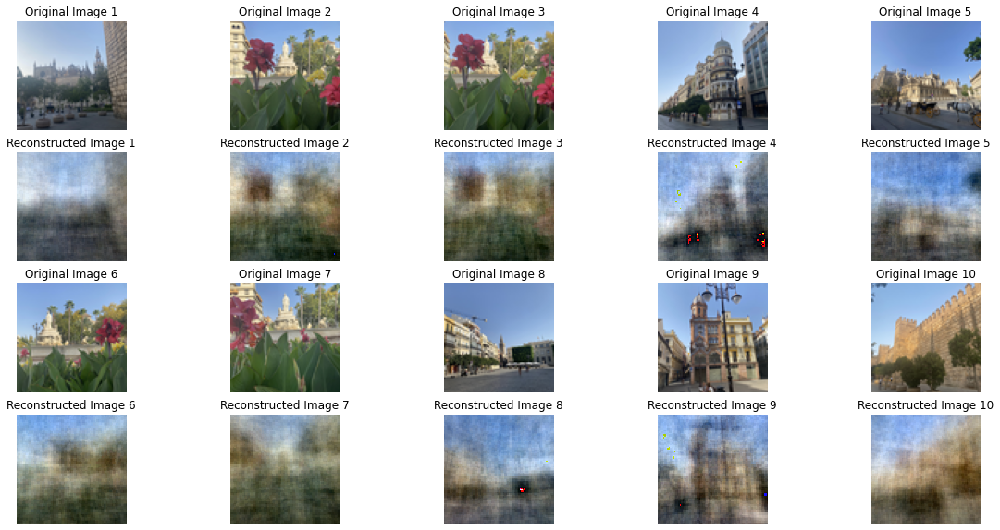

In [16]:
nrows, ncols = 4,5
fig, ax = plt.subplots(nrows,ncols, figsize=(20,10))

for i in range(10):
    r = (i // ncols)*2
    c = i % ncols
    # original image
    ax[r,c].imshow(s_data[i])
    ax[r,c].axis('off')
    ax[r,c].set_title(f'Original Image {i+1}')
    
    # reconstructed images after 2d PCA projection
    reshape = np.reshape(inv_trans_sp[i,:],(IM_SIZE,IM_SIZE,3))
    img = Image.fromarray(reshape.astype(np.uint8),mode='RGB')
    ax[r+1,c].imshow(img,interpolation='nearest')
    ax[r+1,c].axis('off')
    ax[r+1,c].set_title(f'Reconstructed Image {i+1}')

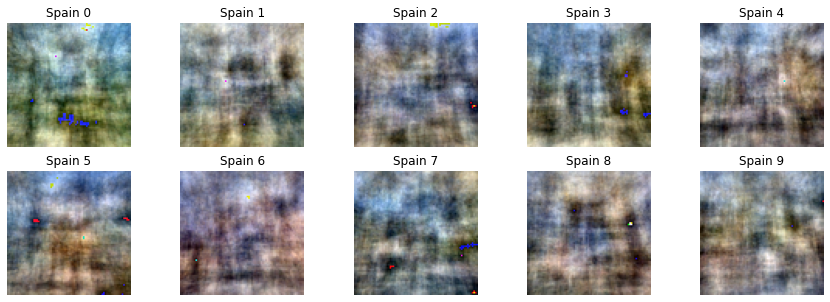

In [173]:
# generate new photos of spain
fig, ax = plt.subplots(2,5, figsize=(15,5))
r = 0
c = 0
for i in range(10):
  new_point = pca_sp.inverse_transform(random.sample(range(-1000,1000), COMPS))
  new_img = Image.fromarray((new_point.astype(np.uint8)).reshape(IM_SIZE,IM_SIZE,3),mode='RGB')

  ax[r,c].imshow(new_img)
  ax[r,c].axis('off')
  ax[r,c].set_title(f'Spain {i}')
  c += 1
  if c > 4:
    r +=1
    c = 0
plt.show()


Spanish photos have some more reddish and yellow-greenish hues to them. 

### Combined

In [44]:
flattened = all_data.reshape(len(all_data),IM_SIZE*IM_SIZE*3)
flattened.shape

(1014, 19200)

In [45]:
COMPS = 80
pca = PCA(COMPS)

proj_imgs = pca.fit_transform(flattened)
proj_imgs

array([[ -512.06629839,  1637.97454585, -1395.79127005, ...,
          188.33205656,  -382.05007187,  -682.70439561],
       [-1984.86372545,  -889.31013694,  -801.56343277, ...,
         -374.01115191,  -461.03595923,   422.18622446],
       [ 1904.88733779,  4131.39719863, -3272.3118612 , ...,
         -341.86692532,   -85.24554838,   110.81273169],
       ...,
       [ 1347.17635258,  -916.59510161,   735.36161867, ...,
         -172.07195515,  -499.11769729,   191.87578795],
       [ 1669.005564  , -2091.72778635,  -388.14894144, ...,
          470.679529  ,  -771.65473513,  -153.35845084],
       [  295.48713316, -2500.58033718, -2750.80392957, ...,
          428.99885663,  -291.07091064,  -156.66161154]])

In [46]:
np.cumsum(pca.explained_variance_ratio_)*100

array([17.21978145, 25.61831751, 31.8512141 , 36.48257248, 40.10594315,
       43.12487965, 45.73994718, 47.77839713, 49.43053493, 50.8898496 ,
       52.23893407, 53.47743949, 54.60611948, 55.64165043, 56.60085628,
       57.54408534, 58.44552427, 59.28336302, 59.98297211, 60.63962382,
       61.24771125, 61.82884527, 62.38942257, 62.92772668, 63.42523422,
       63.91541442, 64.39188638, 64.84453467, 65.27751157, 65.69375656,
       66.09989507, 66.49096178, 66.86291456, 67.23028671, 67.58235417,
       67.92385129, 68.25210297, 68.56689784, 68.87899274, 69.1823277 ,
       69.47702053, 69.75372962, 70.02334295, 70.28789468, 70.54862496,
       70.80409301, 71.04963321, 71.28861374, 71.52135651, 71.75000908,
       71.97435264, 72.19321694, 72.40578268, 72.61660067, 72.82522611,
       73.03141984, 73.23393975, 73.43049   , 73.61874492, 73.80586059,
       73.99008091, 74.17365167, 74.34955233, 74.52317734, 74.69320079,
       74.8618914 , 75.02663528, 75.18933983, 75.34940463, 75.50

80 components explain 77% of the variance between the photos.

In [47]:
inv_trans = pca_sp.inverse_transform(proj_imgs_sp)

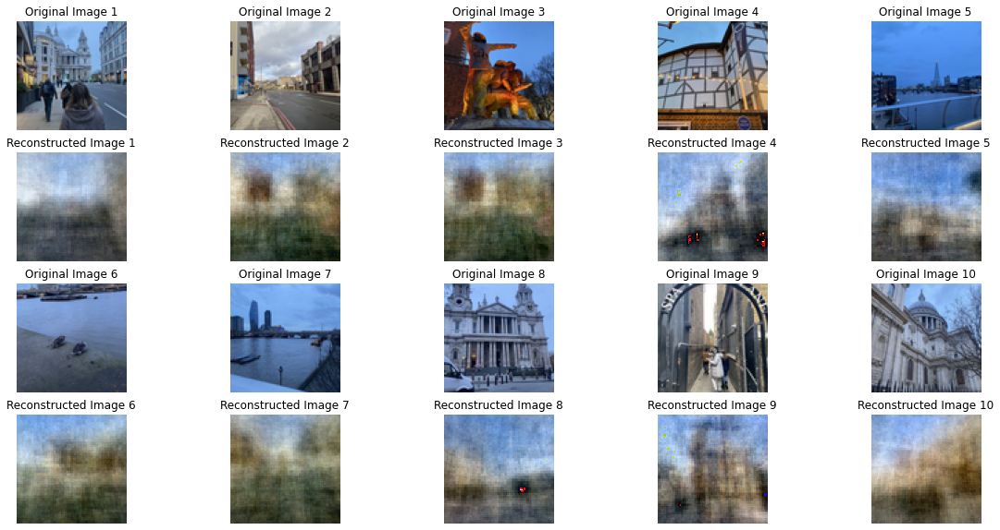

In [48]:
nrows, ncols = 4,5
fig, ax = plt.subplots(nrows,ncols, figsize=(20,10))

for i in range(10):
    r = (i // ncols)*2
    c = i % ncols
    # original image
    ax[r,c].imshow(all_data[i])
    ax[r,c].axis('off')
    ax[r,c].set_title(f'Original Image {i+1}')
    
    # reconstructed images after 2d PCA projection
    reshape = np.reshape(inv_trans[i,:],(IM_SIZE,IM_SIZE,3))
    img = Image.fromarray(reshape.astype(np.uint8),mode='RGB')
    ax[r+1,c].imshow(img,interpolation='nearest')
    ax[r+1,c].axis('off')
    ax[r+1,c].set_title(f'Reconstructed Image {i+1}')

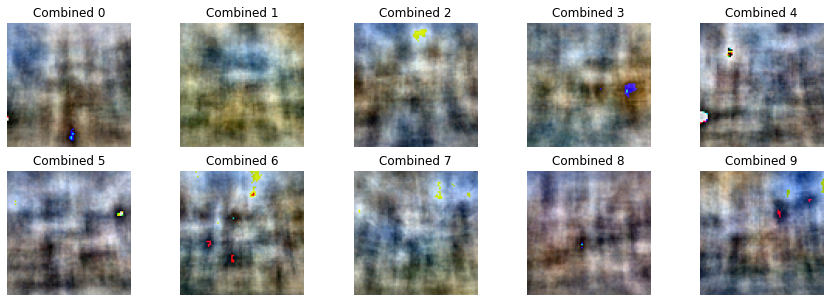

In [170]:
# generate new photos of spain
fig, ax = plt.subplots(2,5, figsize=(15,5))
r = 0
c = 0
for i in range(10):
  new_point = pca.inverse_transform(random.sample(range(-1000,1000), COMPS))
  new_img = Image.fromarray((new_point.astype(np.uint8)).reshape(IM_SIZE,IM_SIZE,3),mode='RGB')

  ax[r,c].imshow(new_img)
  ax[r,c].axis('off')
  ax[r,c].set_title(f'Combined {i}')
  c += 1
  if c > 4:
    r +=1
    c = 0
plt.show()

Adding the two together, we can see the dense textures of England and the reddish-purple hues of Spain.

# Classification
I am interested to see if our generated images can be easily classified by a Support Vector Machine as either Spanish or English. I will train the machine on generated images of either country, then test the classifier on a test dataset of other generated photos of each country, as well as images generated from the combined dataset to see which gets assigned to what.

In [114]:
eng_train = [pca_eng.inverse_transform(random.sample(range(-1000,1000), COMPS)) for _ in range(1000)]
sp_train = [pca_sp.inverse_transform(random.sample(range(-1000,1000), COMPS)) for _ in range(1000)]

eng_test = [pca_eng.inverse_transform(random.sample(range(-1000,1000), COMPS)) for _ in range(100)]
sp_test = [pca_sp.inverse_transform(random.sample(range(-1000,1000), COMPS)) for _ in range(100)]
all_test = [pca.inverse_transform(random.sample(range(-1000,1000), COMPS)) for _ in range(100)]


In [115]:
eng_trainy = [0]*1000
sp_trainy = [1]*1000
eng_testy = [0]*100
sp_testy = [1]*100

In [122]:
X_train = np.array(eng_train+sp_train)
y_train = np.array(eng_trainy + sp_trainy)

X_test = np.array(eng_test + sp_test)
y_test = np.array(eng_testy + sp_testy)
all_test = np.array(all_test)

In [123]:
# run several different types of SVMs

# linear
lin = SVC(kernel='linear')
lin.fit(X_train, y_train)
y_pred_lin = lin.predict(X_test)
y_pred_lin_es = lin.predict(all_test)


# poly (degree = 2)
poly = SVC(kernel='poly', degree=2)
poly.fit(X_train, y_train)
y_pred_poly = poly.predict(X_test)
y_pred_poly_es = poly.predict(all_test)

# rbf
rbf = SVC(kernel='rbf')
rbf.fit(X_train, y_train)
y_pred_rbf = rbf.predict(X_test)
y_pred_rbf_es = rbf.predict(all_test)

In [118]:
def metrics(kernel_name, ytrue,ypred):
    print(f'Metrics for {kernel_name} kernel:\n')
    print(f'Accuracy: {accuracy_score(ytrue,ypred)}')
    print(f'Precision: {precision_score(ytrue, ypred)}')
    print(f'Recall: {recall_score(ytrue, ypred)}')
    print(f'Confusion Matrix: \n{confusion_matrix(ytrue,ypred)}\n')

In [124]:
metrics('linear', y_test, y_pred_lin)
metrics('poly', y_test, y_pred_poly,)
metrics('rbf', y_test, y_pred_rbf)

Metrics for linear kernel:

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
Confusion Matrix: 
[[100   0]
 [  0 100]]

Metrics for poly kernel:

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
Confusion Matrix: 
[[100   0]
 [  0 100]]

Metrics for rbf kernel:

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
Confusion Matrix: 
[[100   0]
 [  0 100]]



The model is incredibly accurate at classifying English and Spanish generated photos. Based on this, our combination photo classification should be informative: which photos contain more Spanish features, and which more English features?

In [127]:
X_train.shape

(2000, 19200)

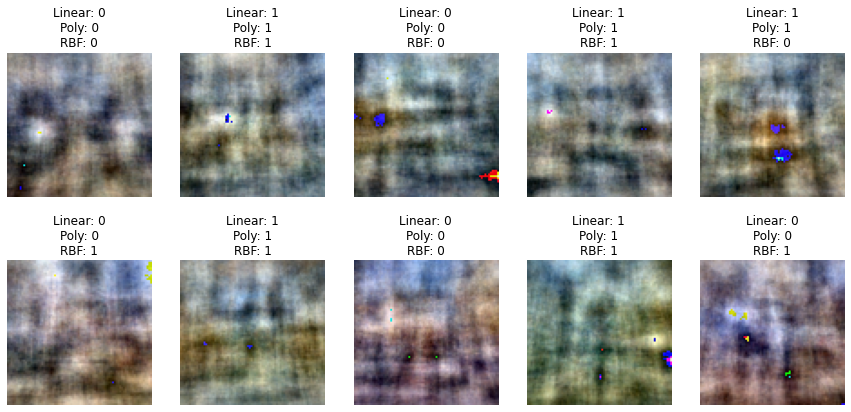

In [178]:
# generate new photos of spain
fig, ax = plt.subplots(2,5, figsize=(15,7))
r = 0
c = 0
for i in range(10):
  new_img = Image.fromarray((all_test[i].astype(np.uint8)).reshape(IM_SIZE,IM_SIZE,3),mode='RGB')

  ax[r,c].imshow(new_img)
  ax[r,c].axis('off')
  ax[r,c].set_title((f'Linear: {y_pred_lin_es[i]}\nPoly: {y_pred_poly_es[i]}\nRBF: {y_pred_rbf_es[i]}'))
  c += 1
  if c > 4:
    r +=1
    c = 0
plt.show()

There is slightly more disagreement here between the models, but they still are largely able to determine that one image resembles a certain country over another.

# Neural Network
I will now attempt a Generational Adversarial Neural Network (GANN) implementation that I adapted from [this](https://towardsdatascience.com/image-generation-in-10-minutes-with-generative-adversarial-networks-c2afc56bfa3b) tutorial. It was written to generate black and white MNIST digits, and I adapted the code to accept RGB data. The results were very limited by my GPU availability and access to a sophisticated generator network which would have created noise that would have been much closer to what was expected.

The GANN works as follows: A discriminator network is trained on actual images that we are trying to generate. A generator network generates random noise, which is then fed to the discriminator. This should reject this image as fake: it doesn't look close enough to the training images. Eventually, the generator is trained to create images that resemble the training data, which the discriminator accepts as true images.

## Build Model
### Generator
The tutorial generator only created grayscale images of a 28x28 size. I modified this to generate RGB images of 80x80 size. It utilizes Dense, BatchNormalization, and Leaky ReLU layers, as well as Convolutional 2D transpose layers. This is a convolutional neural network, generating an entire image out of a small array of random noise. 

There are several lingering print statements for debugging purposes.

In [142]:
BUFFER_SIZE = 60000

BATCH_SIZE = 50
e_nn = tf.data.Dataset.from_tensor_slices(e_data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [143]:
s_nn = tf.data.Dataset.from_tensor_slices(s_data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [144]:
nn = tf.data.Dataset.from_tensor_slices(all_data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [145]:
A = int(IM_SIZE/4)
B = int(IM_SIZE/2)
C = int(IM_SIZE)
def make_generator_model():
    model = tf.keras.Sequential()
    print('0')
    model.add(Dense(A*A*256*3, use_bias=False, input_shape=(100,)))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Reshape((A, A, 256*3)))
    print('a')
    assert model.output_shape == (None, A, A, 256*3) # Note: None is the batch size

    model.add(Conv2DTranspose(128*3, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    print('b')
    assert model.output_shape == (None, A, A, 128*3)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(64*3, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    print('c')
    assert model.output_shape == (None, B, B, 64*3)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    print('d')
    assert model.output_shape == (None, C, C, 3)

    return model

In [146]:
generator = make_generator_model()

0
a
b
c
d


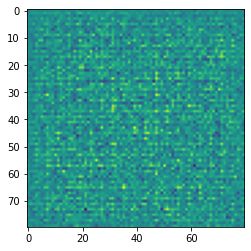

In [147]:
# Create a random noise and generate a sample
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
# Visualize the generated sample
plt.imshow(generated_image[0, :, :, 0])

In [148]:
generator.layers

### Discriminator
The discriminator now needs to do the opposite of the generator: it takes an entire image array and compresses it down to one value to classify the image as true or false. Negative values represent a rejected image.

In [149]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    
    model.add(Conv2D(64*3, (5, 5), strides=(2, 2), padding='same', input_shape=[C, C, 3]))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))

    model.add(Conv2D(128*3, (5, 5), strides=(2, 2), padding='same'))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(1))

    return model

In [150]:
discriminator = make_discriminator_model()

In [151]:

decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00012995]], shape=(1, 1), dtype=float32)


In [152]:
generated_image.shape

TensorShape([1, 80, 80, 3])

In [153]:
discriminator(e_data[0].reshape(1,80,80,3))

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[9.742519]], dtype=float32)>

In [154]:
discriminator(s_data[0].reshape(1,80,80,3))

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[7.746855]], dtype=float32)>

In [155]:
discriminator(all_data[0].reshape(1,80,80,3))

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[9.742519]], dtype=float32)>

This is the discriminator's output prior to training, and are generally unreliable.

## Configure Model
Since we are training two sub-networks inside a GAN network, we need to define two loss functions and two optimizers.
Each neural network within the GANN needs a loss function and an optimizer.
#### Loss Functions
Since we are classifying an image as true or false, we start by using a Binary Crossentropy loss function.

The discriminator and generator each use custom loss functions.

The discriminator loss is calculated as predictions of real images onto an array of ones and the prediction of generated images onto an array of zeros.

The generator loss is calculated by how well it tricks the discriminator, so the discriminator's predictions of generated images onto an array of ones.

#### Optimizers
We then use the Adam optimizer.


In [156]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Set Checkpoints
Adding checkpoints allows us to build on existing neural networks in the future.

In [157]:
import os

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Train the model

In [158]:
EPOCHS = 60
# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
num_examples_to_generate = 16
noise_dim = 100
# Our seed is the noise that we use to generate images on top of. 
# The code below generates a random array with normal distribution with the shape (16, 100).
seed = tf.random.normal([num_examples_to_generate, noise_dim])

### Define training step
This training step function was written by the article's author. It does the following:
1. Creates random noise
2. Generates images based on the noise and calculates loss functions
3. Calculates gradients based on loss function output
4. Processes gradients and runs optimizer

In [159]:
# tf.function annotation causes the function 
# to be "compiled" as part of the training
@tf.function
def train_step(images):
    print('in')
    # 1 - create random noise
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    print('noise')
    # 2 - generate images and calculate loss values
    # GradientTape method records operations for automatic differentiation.
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      print('tape')
      generated_images = generator(noise, training=True)
      print('gen')

      real_output = discriminator(images, training=True)
      print('real')
      fake_output = discriminator(generated_images, training=True)
      print('fake')

      gen_loss = generator_loss(fake_output)
      print('genloss')
      disc_loss = discriminator_loss(real_output, fake_output)
      print('dloss')

    # 3 - calculate gradients using loss values and model variables
    gradients_of_generator = gen_tape.gradient(gen_loss, 
                                               generator.trainable_variables)
    print('gengrad')
    gradients_of_discriminator = disc_tape.gradient(disc_loss, 
                                                discriminator.trainable_variables)
    print('dgrad')
    
    # 4 - process  gradients and run the optimizer
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    print('gop')
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    print('dop')


### Define training loop
This training function, also defined by the article author, runs each batch of the dataset through the training step and creates image output.

In [160]:

import time
from IPython import display # A command shell for interactive computing in Python.

def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()
    print('start')
    for image_batch in dataset:
      train_step(image_batch)
    print('h')

    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)


    if (epoch + 1) % 5 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

### Image generation function
This is the function responsible for generating the images in the above training loop.

In [161]:
def generate_and_save_images(model, epoch, test_input):

  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4,4))
  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0])
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

## Train the model
I then train the model three separate times on the different datasets: England, Spain, and Combined.

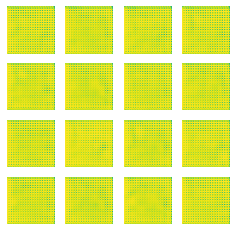

In [162]:

train(e_nn, EPOCHS)

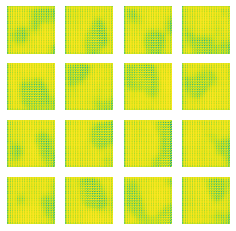

In [ ]:
train(s_nn, EPOCHS)

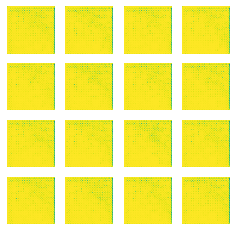

In [79]:
train(nn,EPOCHS)

## Generate images

In [163]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

These display the outputs for each dataset.

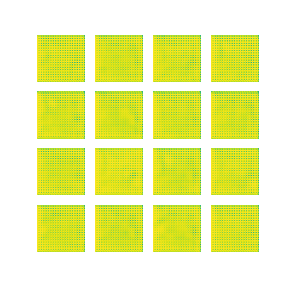

In [164]:
# england
# PIL is a library which may open different image file formats
import PIL 
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
display_image(EPOCHS)

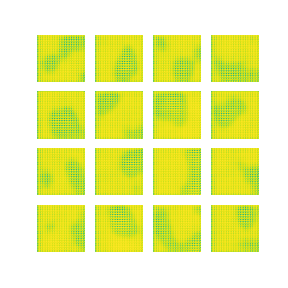

In [39]:
# spain
# PIL is a library which may open different image file formats
import PIL 
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
display_image(EPOCHS)

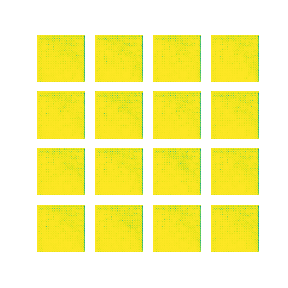

In [80]:
# spain
# PIL is a library which may open different image file formats
import PIL 
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
display_image(EPOCHS)

These create a gif output of the images evolving to this point.

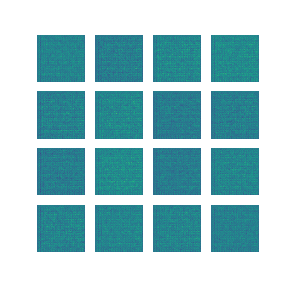

In [165]:
import glob # The glob module is used for Unix style pathname pattern expansion.
import imageio # The library that provides an easy interface to read and write a wide range of image data

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  # image = imageio.imread(filename)
  # writer.append_data(image)
  
display.Image(open('dcgan.gif','rb').read())

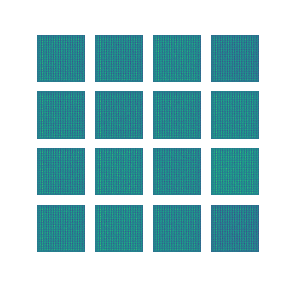

In [40]:
import glob # The glob module is used for Unix style pathname pattern expansion.
import imageio # The library that provides an easy interface to read and write a wide range of image data

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  # image = imageio.imread(filename)
  # writer.append_data(image)
  
display.Image(open('dcgan.gif','rb').read())

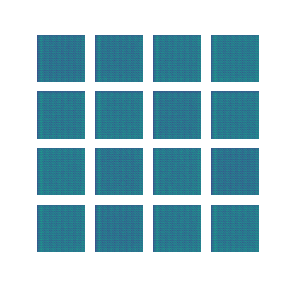

In [81]:
import glob # The glob module is used for Unix style pathname pattern expansion.
import imageio # The library that provides an easy interface to read and write a wide range of image data

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  # image = imageio.imread(filename)
  # writer.append_data(image)
  
display.Image(open('dcgan.gif','rb').read())

Overall, the neural network does very poorly. While the gif shows some variability in the development over time of some shapes, it overall seems to accept very poor images that are mainly yellow as true. While it is most plausible that a neural network would generate realistic output (examples of these on the internet abound), I simply do not have the resources to create one meaningful enough for this kind of problem. The PCA dimension reduction technique results in more legible output for this application, but has a solid limitation of the image resolution without more consistent images to determine shapes from. The neural network has the potential to identify components of an image---rather than the entire image---and piece them together to create a plausible output. Of course, that's not the case here, but one can dream.